<a href="https://colab.research.google.com/github/dominiquebuford/CV_project3/blob/dombuford/run_cGAN_CV3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# set up access to Kaggle API
!pip install -q kaggle
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json
kaggle.json


In [50]:
import pandas as pd
!pip install -q --upgrade torch_snippets
from torch_snippets import *
device = "cuda" if torch.cuda.is_available() else "cpu"
from torchvision.utils import make_grid
from torch_snippets import *
from PIL import Image
import torchvision
from torchvision import transforms
import torchvision.utils as vutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.2/204.2 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 33.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.8/30.8 MB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 68.4 MB/s eta 0:0

In [37]:
!kaggle datasets download -d yuulind/imdb-clean


100% 6.83G/6.83G [03:46<00:00, 42.1MB/s]
100% 6.83G/6.83G [03:46<00:00, 32.3MB/s]
unzip:  cannot find or open imbdb-clean.zip, imbdb-clean.zip.zip or imbdb-clean.zip.ZIP.


In [ ]:
!unzip imdb-clean.zip

In [39]:
df = pd.read_csv('imdb_train_new_1024.csv')

In [52]:
 #age range 1-95
age_categories = {
    'age_1_20': range(1, 21),
    'age_21_40': range(21, 41),
    'age_41_60': range(41, 61),
    'age_61_80': range(61, 81),
    'age_81_100': range(81, 101)
}

# Initialize an empty DataFrame to store one-hot encoded values
df_encoded = df.loc[:, ['filename', 'gender', 'x_min', 'y_min', 'x_max', 'y_max']].copy()

# One-hot encode the 'age' column based on custom age categories
for category, age_range in age_categories.items():
    df_encoded[category] = df['age'].apply(lambda x: 1 if x in age_range else 0)


#calculate height,width for crop
df_encoded['height'] = df_encoded['y_max'] - df_encoded['y_min']
df_encoded['width'] = df_encoded['x_max'] - df_encoded['x_min']


In [49]:
df_encoded


,filename,gender,x_min,y_min,x_max,y_max,age_1_20,age_21_40,age_41_60,age_61_80,age_81_100
0,05/nm0200005_rm3512895744_1959-12-24_2009.jpg,M,78.0,93.0,155.0,185.0,0,0,1,0,0
1,02/nm0001002_rm1464638208_1966-7-31_2006.jpg,M,123.0,175.0,245.0,349.0,0,1,0,0,0
2,00/nm0000100_rm103389184_1955-1-6_2005.jpg,M,52.0,70.0,103.0,139.0,0,0,1,0,0
3,04/nm0024404_rm2909178368_1978-2-20_2009.jpg,F,28.0,38.0,55.0,75.0,0,1,0,0,0
4,00/nm0703800_rm31823616_1959-6-6_2008.jpg,M,69.0,100.0,137.0,199.0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
183882,92/nm0000792_rm1388288256_1959-3-6_1996.jpg,M,47.0,56.0,93.0,111.0,0,1,0,0,0
183883,95/nm2933395_rm2089976320_1978-5-4_2005.jpg,F,45.0,58.0,89.0,115.0,0,1,0,0,0
183884,97/nm0504897_rm3787293952_1962-6-27_1997.jpg,M,372.0,341.0,650.0,681.0,0,1,0,0,0
183885,97/nm0136797_rm1485021184_1962-8-16_2013.jpg,M,226.0,311.0,451.0,621.0,0,0,1,0,0


In [51]:
import os

In [58]:
!mkdir cropped_faces_female
!mkdir cropped_faces_male

paths = df_encoded['filename'].tolist()
x_mins = df_encoded['x_min'].tolist()
y_mins = df_encoded['y_min'].tolist()
heights = df_encoded['height'].tolist()
widths = df_encoded['width'].tolist()

original_folder = 'imdb-clean-1024/imdb-clean-1024'
for i in range(len(paths)):
  y = int(y_mins[i])
  x = int(x_mins[i])
  h = int(heights[i])
  w = int(widths[i])
  fullName = os.path.join(original_folder, paths[i])
  img = read(fullName, 1)
  img2 = img[y:(y+h),x:(x+w),:]

  finalImageName =''
  if df_encoded.loc[i, 'gender'] == 'M':
    finalImageName += 'cropped_faces_male/'
  else:
    finalImageName+='cropped_faces_female/'
  if df_encoded.loc[i, 'age_1_20'] == 1:
    finalImageName+= 'age_1_20_'
  elif df_encoded.loc[i, 'age_21_40'] ==1:
    finalImageName+='age_21_40_'
  elif df_encoded.loc[i, 'age_41_60'] ==1:
    finalImageName+='age_41_60_'
  elif df_encoded.loc[i, 'age_61_80'] ==1:
    finalImageName+='age_61_80_'
  else:
    finalImageName+='age_81_100'

  cv2.imwrite(finalImageName+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))



In [59]:
transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

In [60]:
class Faces(Dataset):
    def __init__(self, folders):
        super().__init__()
        self.folderfemale = folders[0]
        self.foldermale = folders[1]
        self.images=sorted(Glob(self.folderfemale))+sorted(Glob(self.foldermale))
    def __len__(self):
        return len(self.images)
    def __getitem__(self, ix):
        image_path = self.images[ix]
        image = Image.open(image_path)
        image = transform(image)
        gender = np.where('female' in str(image_path),1,0)

        #grab the age label as well
        age_categories = ['age_1_20', 'age_21_40', 'age_41_60', 'age_61_80', 'age_81_100']
        age_label = np.argmax([age_category in str(image_path) for age_category in age_categories])
        return image, torch.tensor(gender).long(), torch.tensor(age_label).long()

In [63]:
ds = Faces(folders=['cropped_faces_female','cropped_faces_male'])
dataloader = DataLoader(ds, batch_size=70, shuffle=True, num_workers=8)

In [64]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [65]:
class Discriminator(nn.Module):
    def __init__(self, emb_size=32):
        super(Discriminator, self).__init__()
        self.emb_size = 32
        self.gender_label_embeddings = nn.Embedding(2, self.emb_size)
        self.age_label_embeddings = nn.Embedding(5, self.emb_size)
        self.model = nn.Sequential(
            nn.Conv2d(3,64,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*2,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*4,64*8,4,2,1,bias=False),
            nn.BatchNorm2d(64*8),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*8,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Flatten()
        )
        self.model2 = nn.Sequential(
            nn.Linear(320,100),   #image size is 64 x 2 x 2 + 64 (the two label embeddings) = 320
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(100,1),
            nn.Sigmoid()
        )
        self.apply(weights_init)
    def forward(self, input, gender_labels, age_labels):
        x = self.model(input)
        y = self.gender_label_embeddings(gender_labels)
        z = self.age_label_embeddings(age_labels)
        input = torch.cat([x, y, z], 1)
        final_output = self.model2(input)
        return final_output

In [66]:
class Generator(nn.Module):
    def __init__(self, emb_size=32):
        super(Generator,self).__init__()
        self.emb_size = emb_size
        self.gender_label_embeddings = nn.Embedding(2, self.emb_size)
        self.age_label_embeddings = nn.Embedding(5, self.emb_size)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(100+(2*self.emb_size),64*8,4,1,0,bias=False),
            nn.BatchNorm2d(64*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*8,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*4,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*2,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64,3,4,2,1,bias=False),
            nn.Tanh()
        )
        self.apply(weights_init)
    def forward(self,input_noise,gender_labels, age_labels):
        gender_label_embeddings = self.gender_label_embeddings(gender_labels).view(len(gender_labels), self.emb_size, 1, 1)
        age_label_embeddings = self.age_label_embeddings(age_labels).view(len(age_labels), self.emb_size, 1, 1)

        input = torch.cat([input_noise, gender_label_embeddings, age_label_embeddings], 1)
        return self.model(input)

In [67]:
def noise(size):
    n = torch.randn(size, 100, 1, 1, device=device)
    return n.to(device)

In [68]:
def discriminator_train_step(real_data, real_gender_labels, real_age_labels, fake_data, fake_gender_labels, fake_age_labels):
    d_optimizer.zero_grad()
    prediction_real = discriminator(real_data, real_gender_labels, real_age_labels)
    error_real = loss(prediction_real, torch.ones(len(real_data), 1).to(device))
    error_real.backward()
    prediction_fake = discriminator(fake_data, fake_gender_labels, fake_age_labels)
    error_fake = loss(prediction_fake, torch.zeros(len(fake_data), 1).to(device))
    error_fake.backward()
    d_optimizer.step()
    return error_real + error_fake

In [69]:
def generator_train_step(fake_data, fake_gender_labels, fake_age_labels):
    g_optimizer.zero_grad()
    prediction = discriminator(fake_data, fake_gender_labels, fake_age_labels)
    error = loss(prediction, torch.ones(len(fake_data), 1).to(device))
    error.backward()
    g_optimizer.step()
    return error

In [71]:
discriminator = Discriminator().to(device)
generator = Generator().to(device)
loss = nn.BCELoss()
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
fixed_noise = torch.randn(70, 100, 1, 1, device=device)
fixed_fake_gender_labels = torch.LongTensor([0]*(len(fixed_noise)//2) + [1]*(len(fixed_noise)//2)).to(device)
fixed_fake_age_labels = torch.LongTensor([0]*(len(fixed_noise)//5) + [1]*(len(fixed_noise)//5) + [2]*(len(fixed_noise)//5) + [3]*(len(fixed_noise)//5) + [4]*(len(fixed_noise)//5)).to(device)
loss = nn.BCELoss()
n_epochs = 25
img_list = []

EPOCH: 1.000  g_loss: 4.155  d_loss: 0.470  (352.45s - 8458.70s remaining)


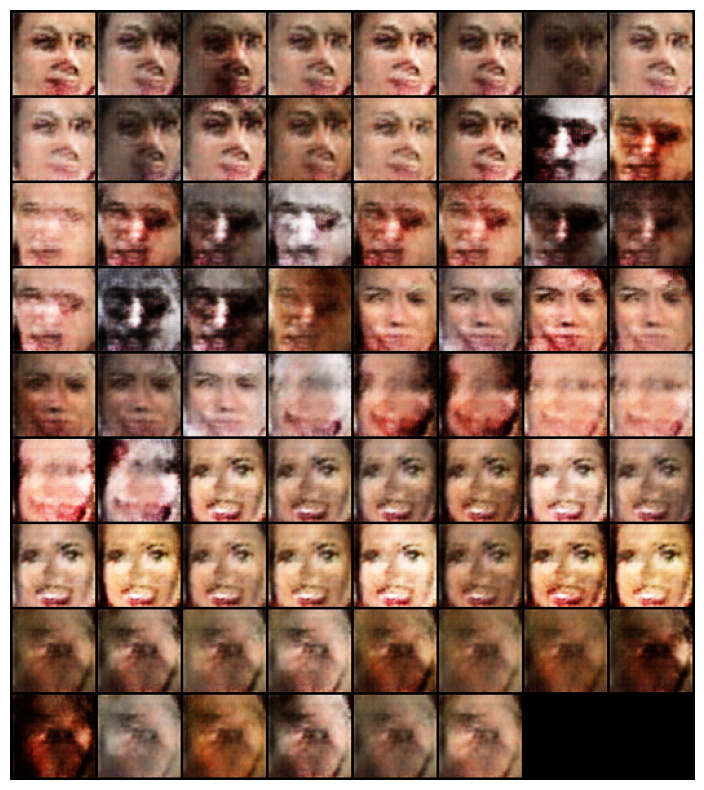

EPOCH: 2.000  g_loss: 5.006  d_loss: 0.277  (711.82s - 8185.92s remaining)


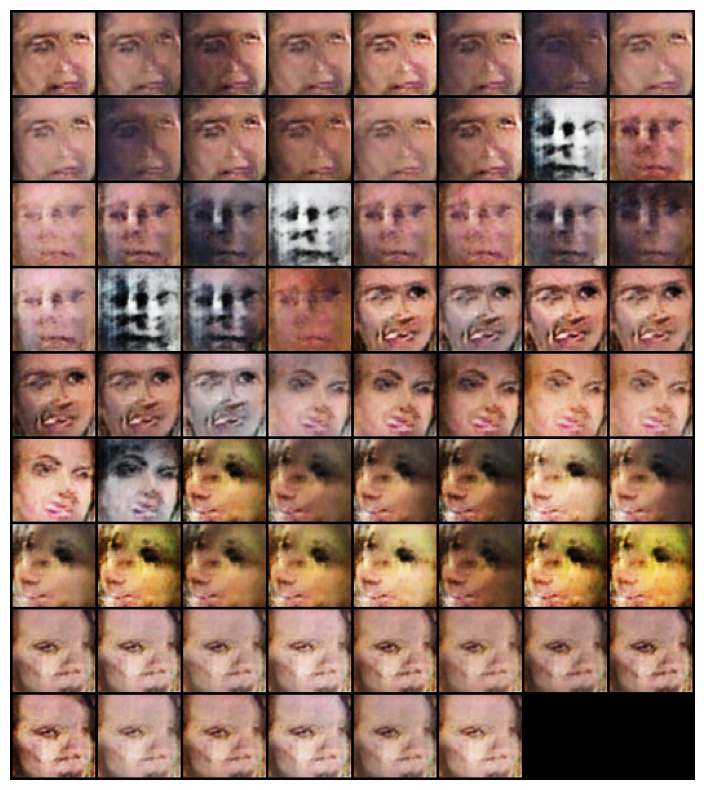

EPOCH: 3.000  g_loss: 5.449  d_loss: 0.231  (1070.41s - 7849.68s remaining)


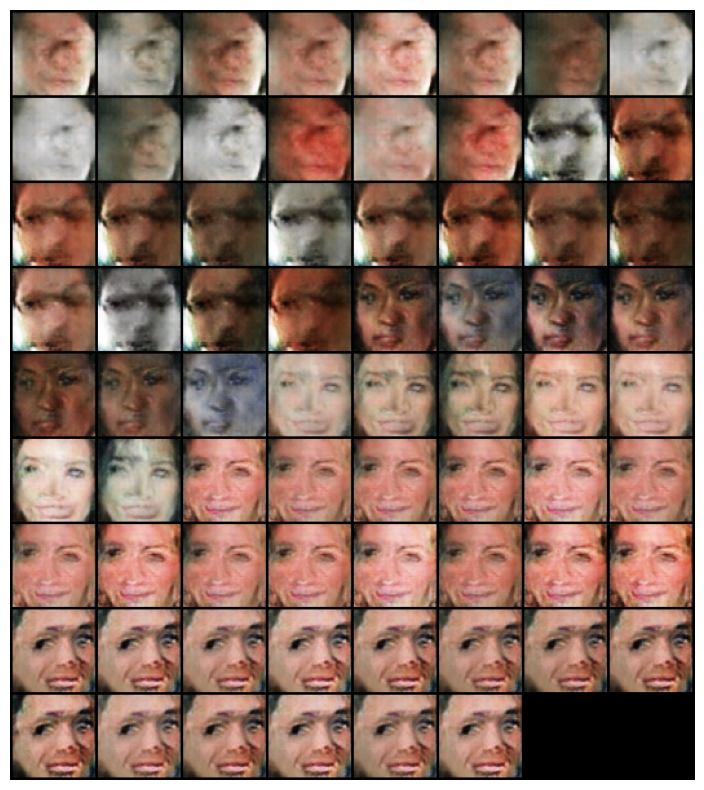

EPOCH: 4.000  g_loss: 5.692  d_loss: 0.215  (1451.17s - 7618.63s remaining)


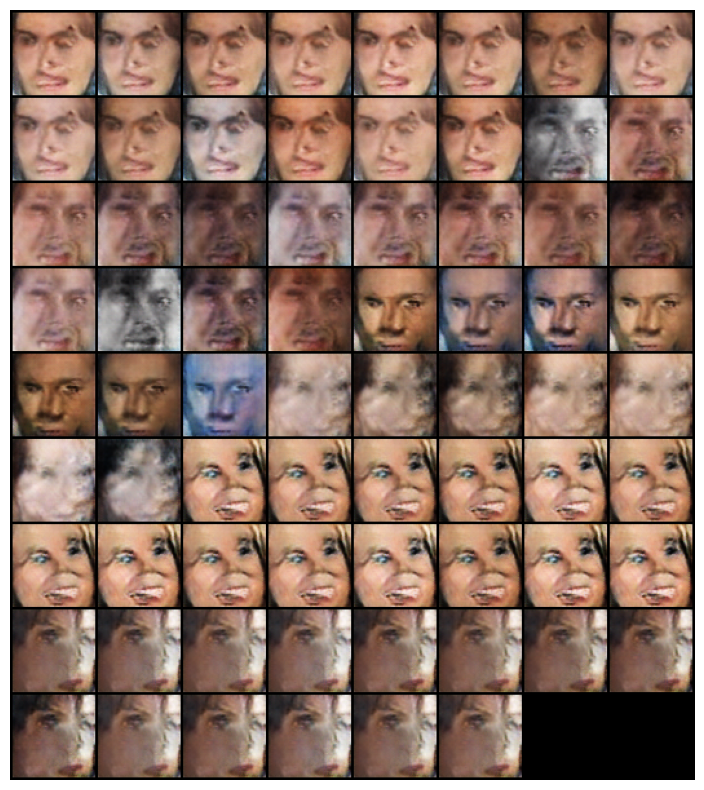

EPOCH: 5.000  g_loss: 5.776  d_loss: 0.210  (1846.37s - 7385.47s remaining)


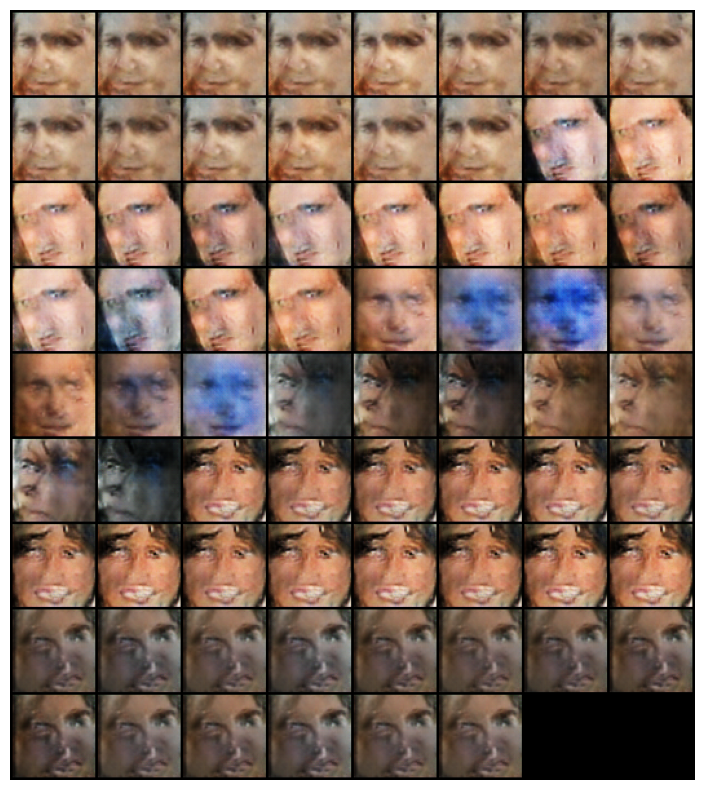

EPOCH: 6.000  g_loss: 5.773  d_loss: 0.213  (2247.16s - 7116.01s remaining)


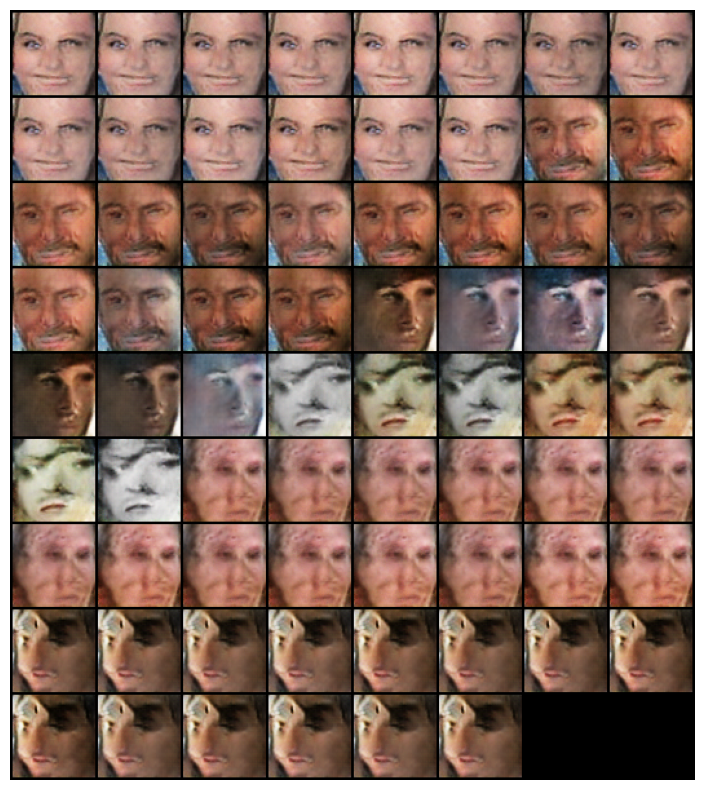

EPOCH: 7.000  g_loss: 5.864  d_loss: 0.213  (2666.88s - 6857.70s remaining)


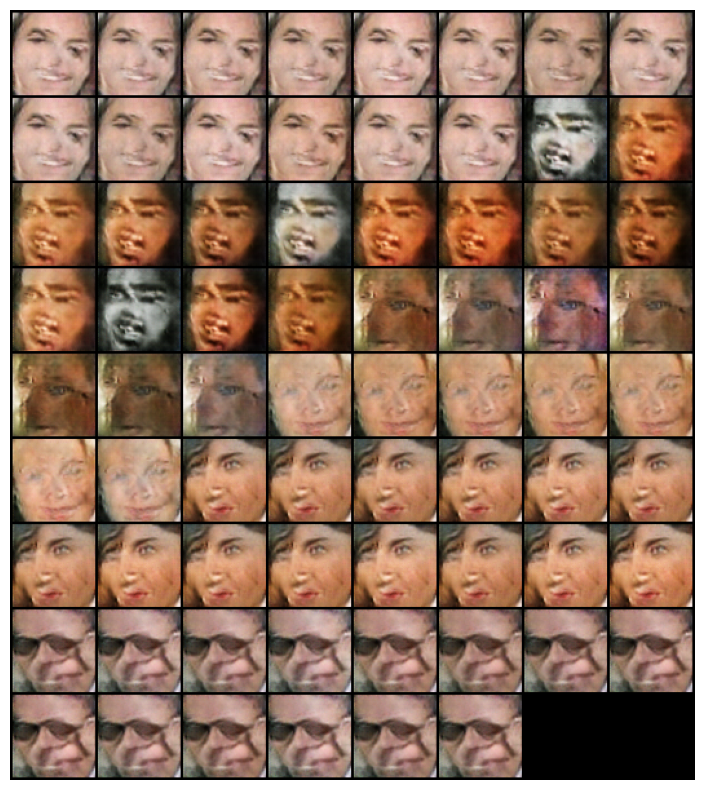

EPOCH: 8.000  g_loss: 5.808  d_loss: 0.203  (3085.17s - 6555.99s remaining)


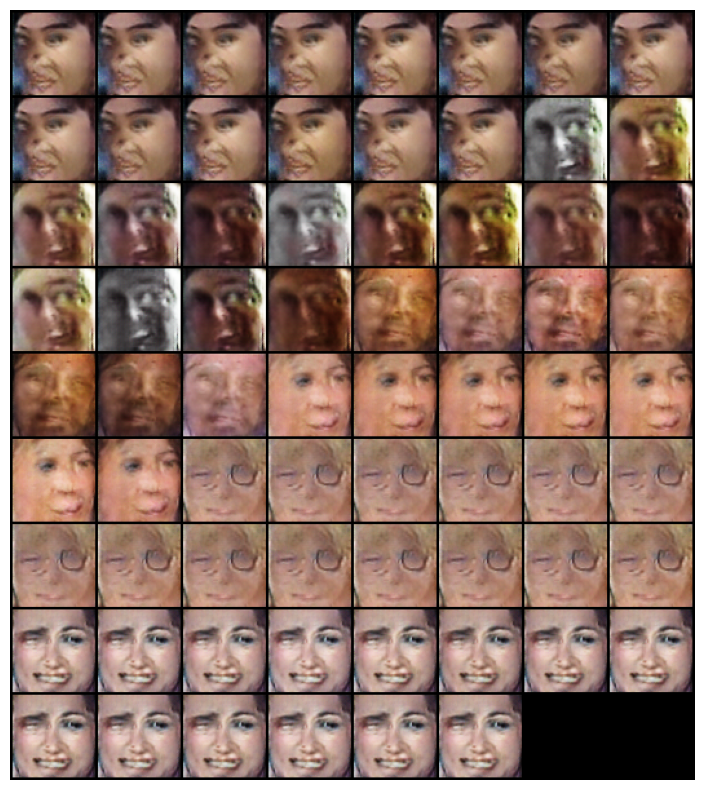

EPOCH: 9.000  g_loss: 6.004  d_loss: 0.200  (3510.77s - 6241.36s remaining)


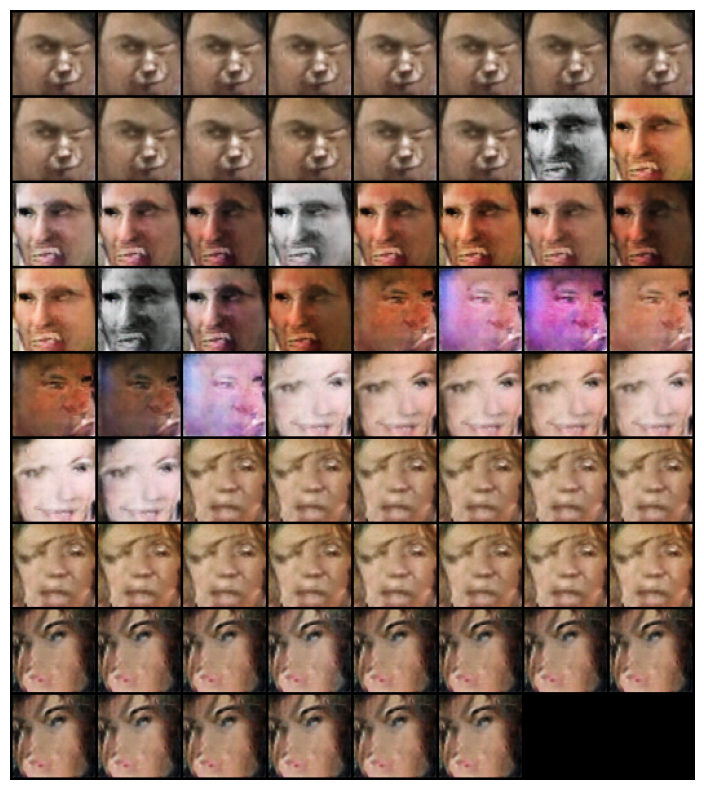

EPOCH: 10.000  g_loss: 6.066  d_loss: 0.195  (3971.80s - 5957.70s remaining)


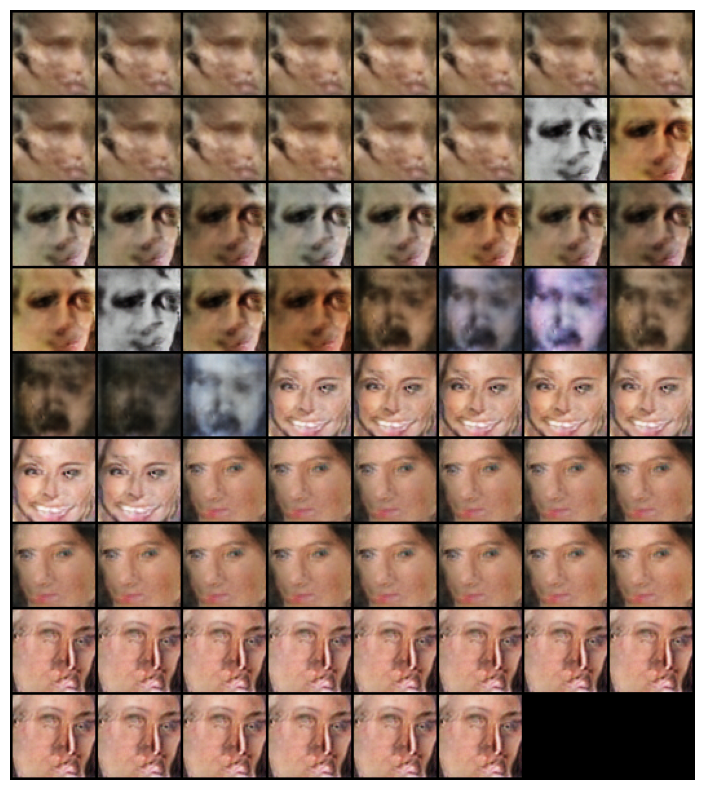

EPOCH: 11.000  g_loss: 6.111  d_loss: 0.198  (4424.11s - 5630.68s remaining)


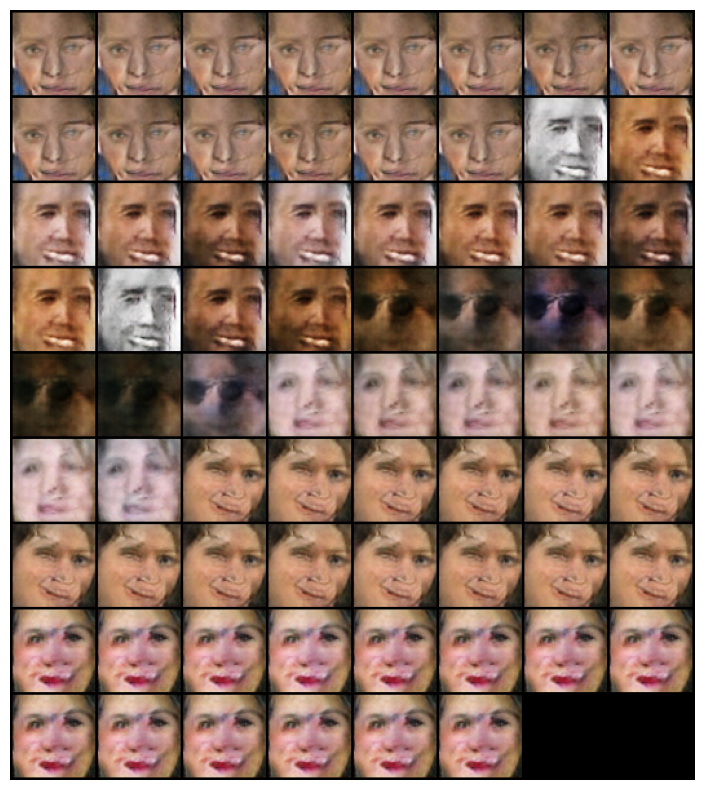

EPOCH: 12.000  g_loss: 6.091  d_loss: 0.194  (4879.11s - 5285.70s remaining)


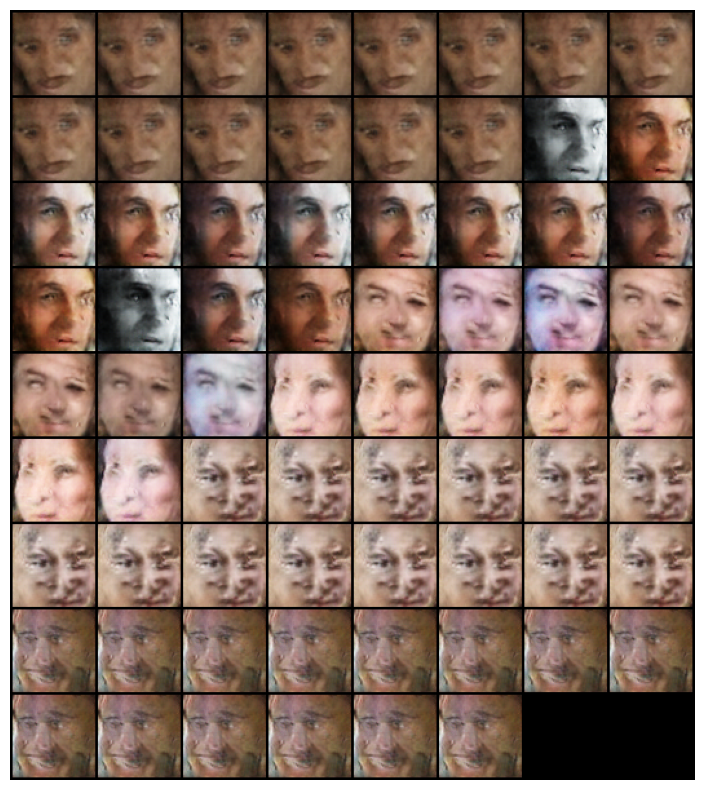

EPOCH: 13.000  g_loss: 6.232  d_loss: 0.179  (5315.25s - 4906.39s remaining)


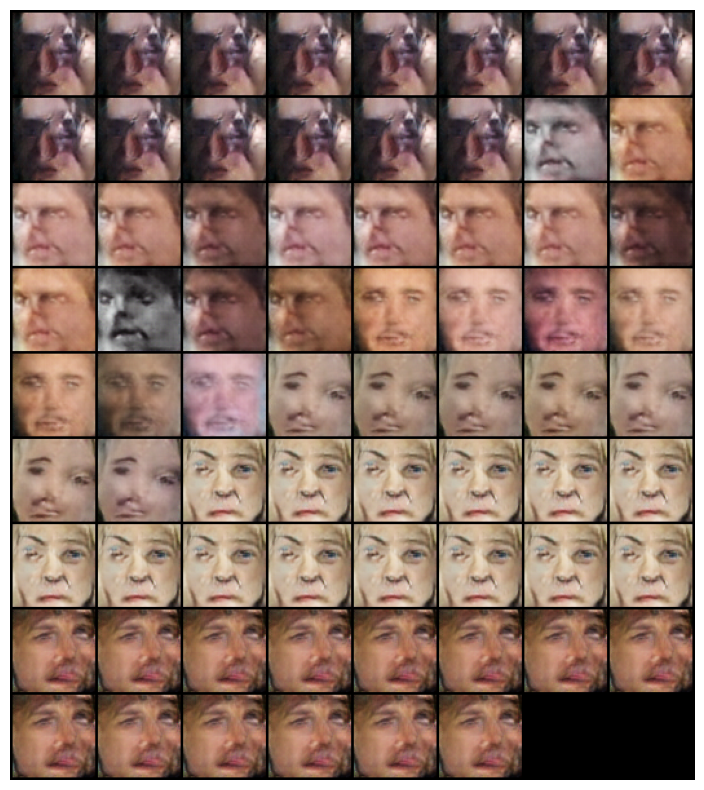

EPOCH: 14.000  g_loss: 6.111  d_loss: 0.176  (5755.41s - 4522.11s remaining)


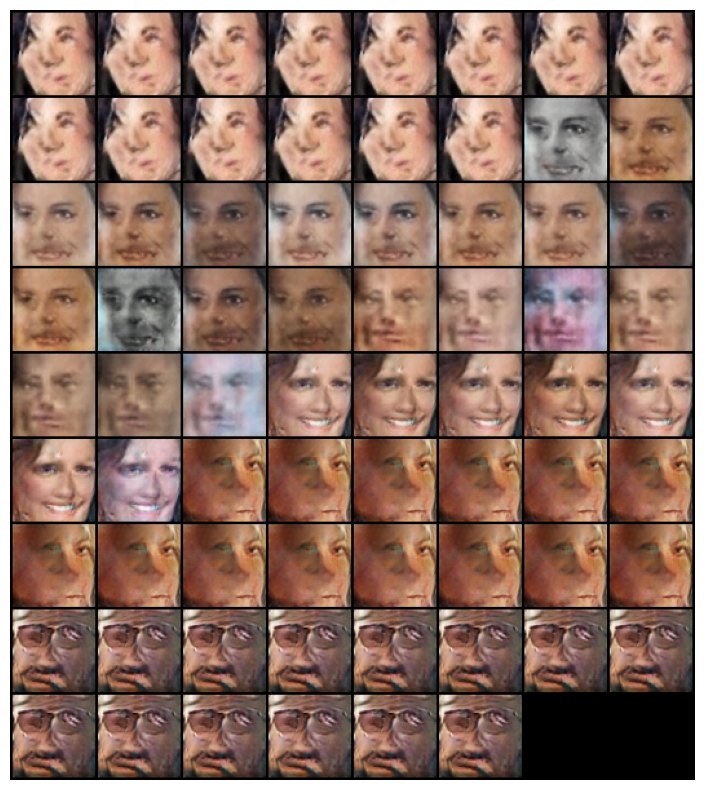

EPOCH: 15.000  g_loss: 6.307  d_loss: 0.176  (6194.23s - 4129.49s remaining)


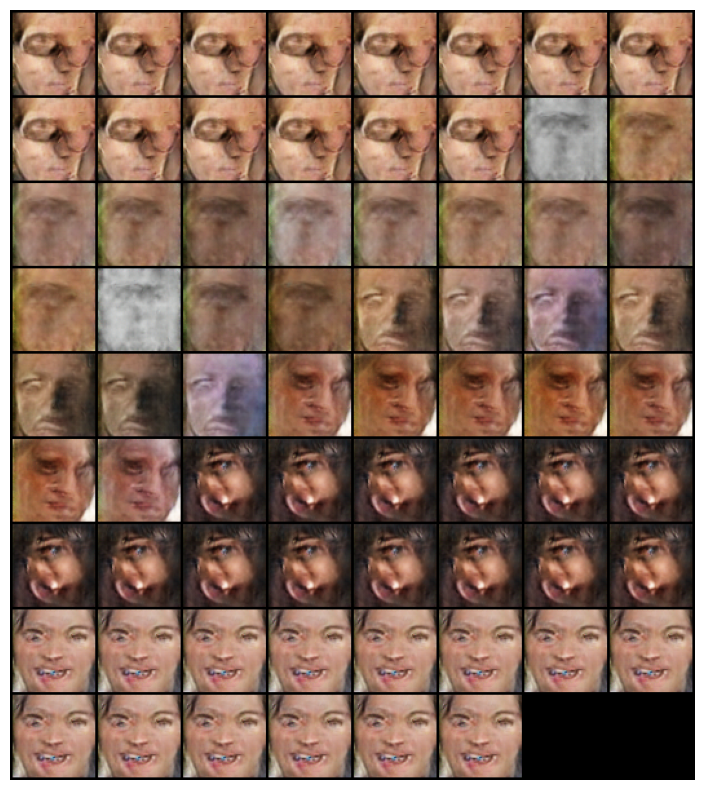

EPOCH: 16.000  g_loss: 6.546  d_loss: 0.165  (6636.99s - 3733.31s remaining)


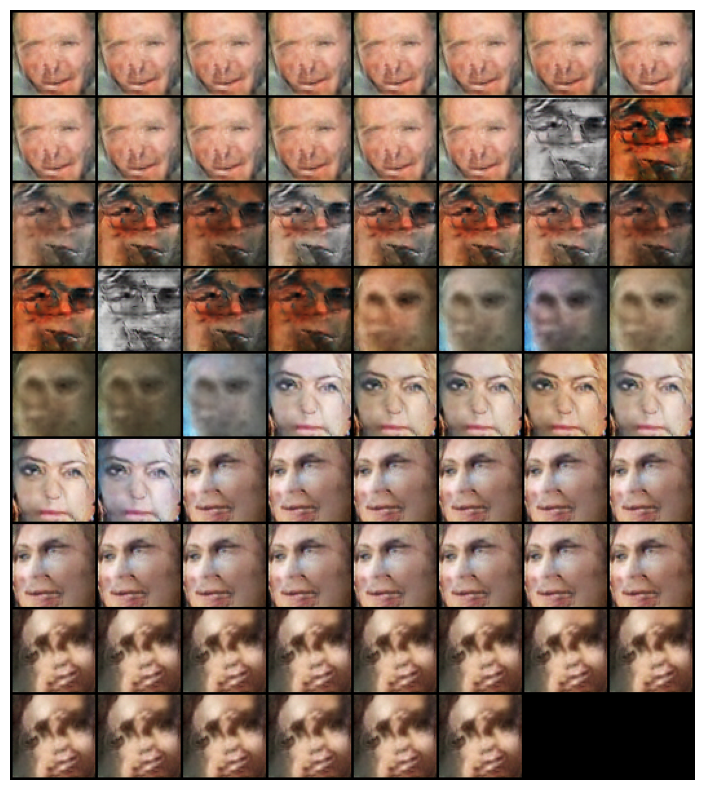

EPOCH: 16.782  d_loss: 0.351  g_loss: 5.210  (6974.19s - 3415.27s remaining)

In [ ]:
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(dataloader)
    for bx, (images, gender_labels, age_labels) in enumerate(dataloader):
        real_data, real_gender_labels, real_age_labels = images.to(device), gender_labels.to(device), age_labels.to(device)
        fake_gender_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_age_labels = torch.LongTensor(np.random.randint(0, 5, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_gender_labels, fake_age_labels)
        fake_data = fake_data.detach()
        d_loss = discriminator_train_step(real_data, real_gender_labels,real_age_labels, fake_data, fake_gender_labels, fake_age_labels)
        fake_gender_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_age_labels = torch.LongTensor(np.random.randint(0, 5, len(real_data))).to(device)

        fake_data = generator(noise(len(real_data)), fake_gender_labels, fake_age_labels).to(device)
        g_loss = generator_train_step(fake_data, fake_gender_labels, fake_age_labels)
        pos = epoch + (1+bx)/N
        log.record(pos, d_loss=d_loss.detach(), g_loss=g_loss.detach(), end='\r')
    log.report_avgs(epoch+1)
    with torch.no_grad():
        fake = generator(fixed_noise, fixed_fake_gender_labels, fixed_fake_age_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)